# Final Independent Project: Blast Off!
Jason Beal \
Computational Physics \
15 December 2020

![Falcon Heavy launch](https://www.spaceflightinsider.com/wp-content/uploads/hangar/header/falcon-9.jpg)

## Motivation

In my First Year Course, Rocket Science, we spent the lab portion of the course designing, assembling, and eventually testing I-Class model rockets. Concurrently, the in-class portion of the course was dedicated to learning about the physics of rocketry. The central equation of this study is, of course, the [rocket equation](https://www.planetary.org/articles/20170428-the-rocket-equation-part-1):

\begin{equation}
  m \ddot{y} = - \dot{m} v_e
\end{equation}

![change in rocket mass](https://nathanielmrouth.files.wordpress.com/2018/12/rocketequation-2.png?w=584)

This equation says that the force imparted on a rocket is equal to the rate of change of its mass times the velocity of the exhaust. When the thrust of a rocket is the only force acting on the it (i.e. no drag or gravity), the motion of the rocket can be [solved for analytically](https://web.mit.edu/16.unified/www/SPRING/propulsion/notes/node103.html): 

\begin{equation}
  m \frac{d v_y}{dt} = - \frac{dm}{dt} v_e
\end{equation}
\
\begin{equation}
  \frac{-1}{v_e} d v_y = \frac{1}{m} dm
\end{equation}
\
\begin{equation}
  \int _{v_0} ^{v_1} \frac{-1}{v_e} d v_y = \int _{m_0} ^{m_1} \frac{1}{m} dm
\end{equation}
\
\begin{equation}
  \frac{-1}{v_e} [v_1 - v_0] = \ln{m_1} - \ln{m_0}
\end{equation}
\
\begin{equation}
  \boxed{v_1 = v_0 + v_e \ln\left({\frac{m_0}{m_1}}\right)}
\end{equation}

Sadly, the real world is not so simple. Even in model rocketry, the equations that govern a rocket's motion are not analytically solveable. At the scale of full-size rockets, calculating a rocket's trajectory is that much more complicated. Fortunately numerical modeling can give us insight into the physics of space flight.

One of the particular challenges with modeling real rockets is that many of the assumptions and approximations made in model rocketry are no longer safe to assume. For example, real rockets cannot be viewed in the reference frame of the earth's surface, but rather the rotation of the earth must be accounted for.

Challenges of modeling trajectory:
- Rotation of the earth (gives non-zero initial velocity)
- Mass of the rocket changes over time (affects thrust and gravitational forces)
- Gravity changes (barely, but significantly) with increasing radius
- Thrust of the rocket changes (if multiple stages are used)
- Air density (and thus drag) decreases with height
- Active guidance control

To narrow the scope of this project, I have chosen use the Space X Falcon 9  as the particular rocket modeled by my code. This means that all the rocket-specific parameters of this code are pulled from the Space X Falcon 9 information dictionary (therefore this code could be reworked for other rockets with different parameters).

![rotation of earth](https://2.bp.blogspot.com/-FaOFmjIsYLU/XMFlZ4D31bI/AAAAAAAAA8E/xtGxxUOkAuYjISiuuf_Uw6o8wxXhLMBlACLcBGAs/s1600/earth.jpg)

![multi-stage rocket](https://www.grc.nasa.gov/www/k-12/rocket/Images/rktstage.gif)

## Questions and Relevance

__Question:__ How much fuel is consumed to put a payload into orbit? How does this change between different orbits?

__Relevance:__ Putting stuff in space is expensive so its crucial to understand how much fuel is required to carry a given payload to a certain orbital radius. Small differences in this ratio lead to miles of difference in terms of orbital radius.

__Specific areas of interest:__ Fuel to mass ratio, gravity turn, multiple dynamic forces (thrust, drag, gravity), initial velocity due to rotation of earth, time duration of each thrust.

__Assumptions:__ Air density decreases exponentially with height (see function defined below), thrust increases with height (as air pressure decreases), rocket is launched from equator so that initial tangential velocity is 450 m/s, rocket modeled is roughly equivalent to a SpaceX Falcon 9 (in terms of parameter presets).

__Inputs:__ Rocket parameters (see dictionary below), launch conditions (see function below), starting location (surface, low earth orbit, geo-stationary orbit), final orbit (low earth orbit, geo-stationary orbit), simulation run time and step size

__Outputs:__ Mass of fuel consumed and mass of payload delivered (for surface to LEO and LEO to GEO)
- Expected outputs (from SpaceX website): surface to LEO (fuel: 448,370 kg, payload: 22,800 kg) and LEO to GEO (fuel: 14,500 kg, payload: 8,300 kg)

![Orbits](https://commsatinfo.weebly.com/uploads/2/7/9/4/27945179/1427284.png?294)

## Libraries

In [ ]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc

## Rocket parameters

In [ ]:
# Falcon 9 information, downloaded from https://docs.spacexdata.com/
# Other info/data taken from https://www.spaceflightinsider.com/hangar/falcon-9/
Falcon_9 = {
    "id": 2,
    "active": True,
    "stages": 2,
    "boosters": 0,
    "cost_per_launch": 50000000,
    "success_rate_pct": 97,
    "first_flight": "2010-06-04",
    "country": "United States",
    "company": "SpaceX",
    "height": {
      "meters": 70,
      "feet": 229.6
    },
    "diameter": {
      "meters": 3.7,
      "feet": 12
    },
    "mass": {
      "kg": 549054,
      "lb": 1207920
    },
    "payload_weights": [
      {
        "id": "leo",
        "name": "Low Earth Orbit",
        "kg": 22800,
        "lb": 50265
      },
      {
        "id": "gto",
        "name": "Geosynchronous Transfer Orbit",
        "kg": 8300,
        "lb": 18300
      },
      {
        "id": "mars",
        "name": "Mars Orbit",
        "kg": 4020,
        "lb": 8860
      }
    ],
    "first_stage": {
      "reusable": True,
      "engines": 9,
      "fuel_amount_tons": 385,
      "burn_time_sec": 162,
      "thrust_sea_level": {
        "kN": 7607,
        "lbf": 1710000
      },
      "thrust_vacuum": {
        "kN": 8227,
        "lbf": 1849500
      }
    },
    "second_stage": {
      "engines": 1,
      "fuel_amount_tons": 90,
      "burn_time_sec": 397,
      "thrust": {
        "kN": 934,
        "lbf": 210000
      },
      "payloads": {
        "option_1": "dragon",
        "option_2": "composite fairing",
        "composite_fairing": {
          "height": {
            "meters": 13.1,
            "feet": 43
          },
          "diameter": {
            "meters": 5.2,
            "feet": 17.1
          }
        }
      }
    },
    "engines": {
      "number": 9,
      "type": "merlin",
      "version": "1D+",
      "layout": "octaweb",
      "engine_loss_max": 2,
      "propellant_1": "liquid oxygen",
      "propellant_2": "RP-1 kerosene",
      "thrust_sea_level": {
        "kN": 845,
        "lbf": 190000
      },
      "thrust_vacuum": {
        "kN": 914,
        "lbf": 205500
      },
      "thrust_to_weight": 180.1
    },
    "landing_legs": {
      "number": 4,
      "material": "carbon fiber"
    },
    "wikipedia": "https://en.wikipedia.org/wiki/Falcon_9",
    "description": "Falcon 9 is a two-stage rocket designed and manufactured by SpaceX for the reliable and safe transport of satellites and the Dragon spacecraft into orbit.",
    "rocket_id": "falcon9",
    "rocket_name": "Falcon 9",
    "rocket_type": "rocket"
  }

## Embedded functions

In [ ]:
# Function that returns the gravitational acceleration at a given radial position
def g(radius):
  G = 6.67 * 10**-11
  M = 5.97 * 10**24
  r = radius
  magr = mag(r)
  g = G * M * r / magr**3
  return g

![gravity vs height](https://sciencevspseudoscience.files.wordpress.com/2013/07/orbital_gravity.png)

In [ ]:
# Function that returns the air density at a given radial position
def rho(radius):
  h = radius - 6371000
  rho = (1.225)*np.e**(-0.00012888*h)
  return rho

![air density vs height](https://qph.fs.quoracdn.net/main-qimg-7929c249fc72fa094d7ec44ec83b8b9c)

In [ ]:
# Function that returns the orbital velocity for a given orbital radius
def v_orbit(r_orbit):
  G = 6.67 * 10**-11
  M = 5.97 * 10**24
  v_req = np.sqrt(G * M / r_orbit)
  return v_req

![orbital velocity](https://qph.fs.quoracdn.net/main-qimg-770d1ab5f3022034d3e5b2c07a950371.webp)

In [ ]:
# Function that returns the magnitude of a given vector
def mag(vector):
  mag_vec = np.sqrt(vector[0]**2 + vector[1]**2)
  return mag_vec

## Trajectory functions

__Flow__
1. Initialize based on start location
2. Prescribe final orbit (and associated conditions)
3. Set up data storage
4. Simulate:
  - Establish motion of rocket vs orientation of rocket
  - Establish control mechanism (dot product of radius and velocity)
  - Choose thrusting dynamics given inputs and control mechanism
  - Calculate net forece
  - Iterate using Euler-Cromer
5. Save and output data

In [ ]:
# Accounts for rotation of earth, changing air density (affects drag force),
# changing mass and gravitational acceleration(affects gravitational force), 
# changing thrust/mass flow rate (affects thrust force).
# Starts: surface, LEO, GEO ;  Orbits: LEO, GEO
# Multiple burns are used, information is pulled from SpaceX and modified
# through testing
# Data storage/output:
# # 0. time
# # 1. dispx
# # 2. dispy
# # 3. radius
# # 4. velox
# # 5. veloy
# # 6. velocity
# # 7. rdotv
# # 8. mass
# # 9. gravity
# # 10. thrust
# # 11. drag

# Function that models the trajectory of a rocket launched into space
def trajectory(start, orbit, dt, T):
  # Initial conditions (for each start)
  if start == "surface":
    v = np.array([450.0, 10.0])
    r = np.array([0.0, 6371000])
    m = Falcon_9["mass"]["kg"]
    last = False
    leo = False
    geo = False
  elif start == "LEO":
    v = np.array([v_orbit(6771000), 0.0])
    r = np.array([0.0, 6771000])
    m = Falcon_9["payload_weights"][0]["kg"]
    last = True
    leo = True
  elif start == "GEO":
    v = np.array([v_orbit(42231625), 0.0])
    r = np.array([0.0, 42231625])
    m = Falcon_9["payload_weights"][1]["kg"]
    geo = True
  
  # Final conditions (for each orbit)
  if orbit == "LEO":
    r_req = 6771000
    v_req = v_orbit(r_req)
    # T = 6000
  elif orbit == "GEO":
    r_req = 42231625
    v_req = v_orbit(r_req)
    # T = 175000

  # Rocket parameters
  burn1 = Falcon_9["first_stage"]["burn_time_sec"] - 5
  bet12 = Falcon_9["first_stage"]["burn_time_sec"] + 25
  burn2 = Falcon_9["first_stage"]["burn_time_sec"] + Falcon_9["second_stage"]["burn_time_sec"] - 44
  thrust1 = 1000*Falcon_9["first_stage"]["thrust_sea_level"]["kN"]
  thrust2 = 1000*Falcon_9["second_stage"]["thrust"]["kN"]
  rdv_pre = 0.0

  # Initialize data storage
  time = [0.0]
  dispx = [r[0]]
  dispy = [r[1]]
  radius = [mag(r)]
  velox = [v[0]]
  veloy = [v[1]]
  velocity = [0.0]
  rdotv = [rdv_pre]
  mass = [m]
  gravity = [9.8]
  thrust = [0.0]
  drag = [0.0]
  output = []

  # Initialize time/indexing
  index = 0
  t = index*dt

  while t < T:
    # The magnitudes of the radius and velocity are useful for many parts of
    # this code, so its one of the first things we do
    magr = mag(r)
    magv = mag(v)

    # The rocket is oriented in the direction of motion in the reference frame
    # of the earth's surface, but this is not true in the reference frame of the
    # whole earth due to the rotation of the earth
    v_roc = v - np.array([450.0, 0.0])
    magv_roc = mag(v_roc)

    # This radius dotted with velocity is a metric that is used to control when
    # the rocket thrusters are fired
    rdv_cur = np.dot(v/magv,r/magr)
    drdv = (rdv_cur - rdv_pre)/dt

    ##### CONTROL MECHANISM start #####
    # This series of IF statements is the aforementioned control mechanism for
    # the rocket thrusters
    if start == "surface": # Controls for stages 1 and 2 of a surface launch
      if t < burn1:
        thru = thrust1*np.e**(0.00048365*t)
        mdot = - 2530.0
      elif t > bet12 and t < burn2 and drdv < 0:
        thru = thrust2
        mdot = - 320.0
      else:
        thru = 0.0
        mdot = 0.0

      if t > 35 and t < 36: # "boost" initiates the gravity turn
        boost = np.array([50.0,0.0])
      else:
        boost = np.array([0.0,0.0])

      if t == burn1: # Stage 1 empty mass discharge
        m -= 25600

      if t > burn2: # LEO achieved, thrusters primed for transfer
        leo = True
        last = True

    elif start == orbit: # Uncontrolled orbit when no launch or transfer occurs
      thru = 0.0
      mdot = 0.0
      boost = np.array([0.0,0.0])
    
    if orbit == "GEO" and leo == True: # Controls for transfer
      if rdv_cur >= 0.0 and rdv_pre <= 0.0 and last == True: # Firing at perigee
        thru = 5000000/dt
        mdot = - 1537/dt
        boost = np.array([0.0,0.0])
      elif rdv_cur <= 0.0 and rdv_pre >= 0.0 and magr > 40000000 and last == True: # Orbit stabilization at apogee
        thru = 13900000/dt
        mdot = - 4275/dt
        boost = np.array([0.0,0.0])
        last = False
        geo = True
      else: geo == True: # Uncontrolled orbit when GEO is achieved
        thru = 0.0
        mdot = 0.0
        boost = np.array([0.0,0.0])
    elif orbit == "LEO" and leo == True:
        thru = 0.0
        mdot = 0.0
        boost = np.array([0.0,0.0])
    ##### CONTROL MECHANISM finish #####

    ##### TRAJECTORY EVOLUTION start #####
    # Thrust, gravity, and drag forces act on rocket as point mass
    F_thru = thru * (v_roc/magv_roc)
    F_drag = - 1.5 * rho(magr) * magv_roc * v_roc
    F_grav = - m * g(r)
    vdot = (F_thru + F_drag + F_grav) / m + boost

    # Forward Euler integration of variables
    v = v + vdot*dt
    r = r + v*dt
    m = m + mdot*dt
    ##### TRAJECTORY EVOLUTION finish #####

    # Reset r.v control parameter
    rdv_pre = rdv_cur

    # Index forward
    index = index + 1
    t = index*dt

    # Store data
    time.append(t)
    dispx.append(r[0])
    dispy.append(r[1])
    radius.append(magr)
    velox.append(v[0])
    veloy.append(v[1])
    velocity.append(magv)
    rdotv.append(rdv_pre)
    mass.append(m)
    gravity.append(mag(F_grav))
    thrust.append(mag(F_thru))
    drag.append(mag(F_drag))
  
  # Save data
  output.append(time)
  output.append(dispx)
  output.append(dispy)
  output.append(radius)
  output.append(velox)
  output.append(veloy)
  output.append(velocity)
  output.append(rdotv)
  output.append(mass)
  output.append(gravity)
  output.append(thrust)
  output.append(drag)
  return output

In [ ]:
# This function defines an orbit trajectory given orbital radius and determines 
# the appropriate orbital velocity automatically; otherwise, much of the same 
# physics governs both the orbit and trajectory code
# Data storage/output:
# # 0. time
# # 1. dispx
# # 2. dispy
# # 3. radius
# # 4. velox
# # 5. veloy

# Function that plots the uncontrolled orbit at a given radius
def orbit(radius, T):
  r = np.array([0.0,radius])
  magr = np.sqrt(r[0]**2 + r[1]**2)
  ang = np.arccos(r[1]/magr)
  G = 6.67 * 10**-11
  M = 5.97 * 10**24
  magv = np.sqrt(G * M / magr)
  vx0 = magv*np.cos(ang)
  vy0 = magv*np.sin(ang)
  v = np.array([vx0, vy0])
  dt = 0.1
  dispx = []
  dispy = []
  radius = []
  velox = []
  veloy = []
  time = []
  output = []
  index = 0
  while index*dt < T:
    a_grav = - g(r)
    v = v + a_grav*dt
    r = r + v*dt
    magr = mag(r)
    index += 1

    time.append(index*dt)
    dispx.append(r[0])
    dispy.append(r[1])
    radius.append(magr)
    velox.append(v[0])
    veloy.append(v[1])
  output.append(time)
  output.append(dispx)
  output.append(dispy)
  output.append(radius)
  output.append(velox)
  output.append(veloy)
  return output

## Trajectory tests

In [ ]:
# Test to show what the orbit looks like for a given radius

# Test to see if the trajectory function is capable of matching the orbit function
# NOTE: that the parameters are set up such that the initial conditions mirror those of the orbit code
surface = orbit(6371000, 5500)
leo = orbit(6750000, 6000)
geo = orbit(42231625, 90000)

In [ ]:
# Function that models the launch and subsequent orbit of a rocket
# Some optimization needs to be done to see what launch angle and initial (ideally nominal) velocity are best
# Also need to inspect how the first (and potentially second) burn(s) situates the rocket in space
# GOAL: when the attitude of the rocket is parallel to the local horizon, the position is orthogonal to the velocity
# This goal is achieved by having the gravity turn and burn sequence optimized
# surf2geo = trajectory("surface", "GEO")

In [ ]:
surf2leo = trajectory("surface", "LEO", 0.01, 6000)

In [ ]:
leo2geo = trajectory("LEO", "GEO", 0.1, 175000)

## Visualizations and analysis

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  import sys


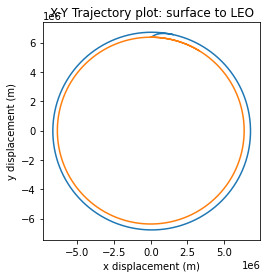

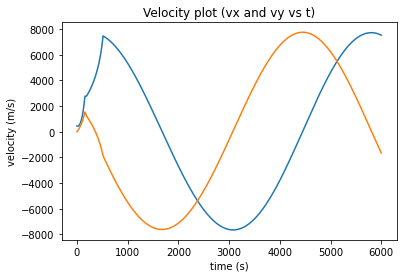

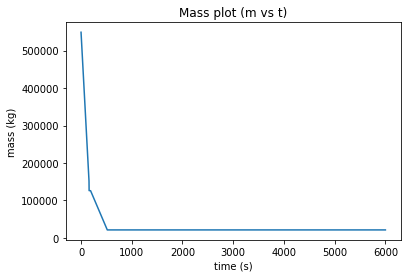

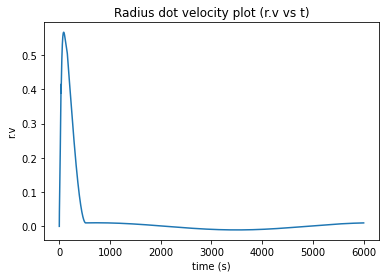

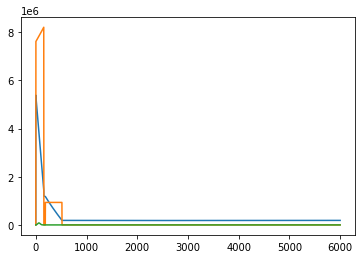

In [ ]:
# Surface to LEO

# x-y trajectory
plt.plot(surf2leo[1], surf2leo[2])
plt.plot(surface[1], surface[2])
# plt.plot(leo[1], leo[2])
plt.axes().set_aspect("equal")
plt.title("X-Y Trajectory plot: surface to LEO")
plt.xlabel("x displacement (m)")
plt.ylabel("y displacement (m)")
plt.show()

# vx and vy
plt.plot(surf2leo[0], surf2leo[4])
plt.plot(surf2leo[0], surf2leo[5])
plt.title("Velocity plot (vx and vy vs t)")
plt.xlabel("time (s)")
plt.ylabel("velocity (m/s)")
plt.show()

# mass
plt.plot(surf2leo[0], surf2leo[8])
plt.title("Mass plot (m vs t)")
plt.xlabel("time (s)")
plt.ylabel("mass (kg)")
plt.show()

# r.v
plt.plot(surf2leo[0], surf2leo[7])
plt.title("Radius dot velocity plot (r.v vs t)")
plt.xlabel("time (s)")
plt.ylabel("r.v")
plt.show()

# forces
plt.plot(surf2leo[0], surf2leo[9])
plt.plot(surf2leo[0], surf2leo[10])
plt.plot(surf2leo[0], surf2leo[11])
plt.show()

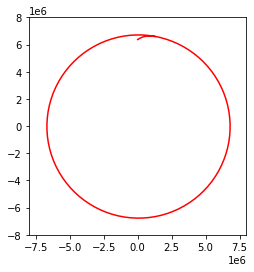

In [ ]:
fig, ax = plt.subplots()
xdata = []
ydata = []
line, = plt.plot([], [], 'r', animated=True)

rx = []
ry = []
for i in range(len(surf2leo[1])):
  if i % 3000 == 0:
    rx.append(surf2leo[1][i])
    ry.append(surf2leo[2][i])

def init():
  ax.set_xlim(-8000000, 8000000)
  ax.set_ylim(-8000000, 8000000)
  ax.set_aspect("equal")
  line.set_data(xdata, ydata)
  return line,

def animate(i):
  xdata.append(rx[i])
  ydata.append(ry[i])
  line.set_data(xdata, ydata)
  return line,

anim = animation.FuncAnimation(fig, animate, init_func=init, 
                               frames=200, interval=20, blit=True)

rc('animation', html='jshtml')
anim

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  import sys


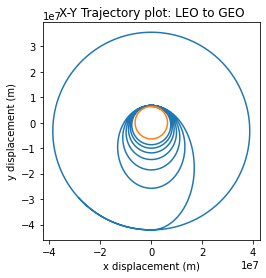

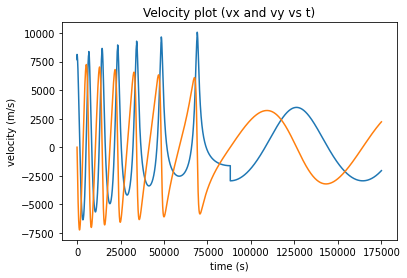

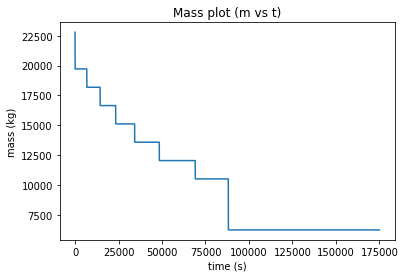

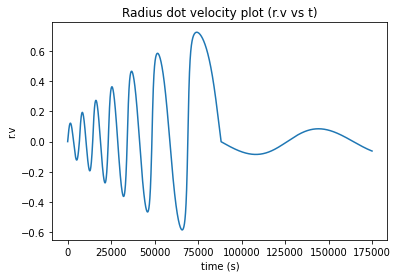

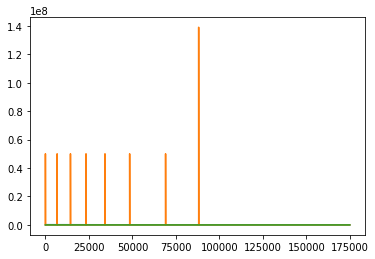

In [ ]:
# LEO to GEO

# x-y trajectory
plt.plot(leo2geo[1], leo2geo[2])
plt.plot(surface[1], surface[2])
# plt.plot(geo[1], geo[2])
plt.axes().set_aspect("equal")
plt.title("X-Y Trajectory plot: LEO to GEO")
plt.xlabel("x displacement (m)")
plt.ylabel("y displacement (m)")
plt.show()

# vx and vy
plt.plot(leo2geo[0], leo2geo[4])
plt.plot(leo2geo[0], leo2geo[5])
plt.title("Velocity plot (vx and vy vs t)")
plt.xlabel("time (s)")
plt.ylabel("velocity (m/s)")
plt.show()

# mass
plt.plot(leo2geo[0], leo2geo[8])
plt.title("Mass plot (m vs t)")
plt.xlabel("time (s)")
plt.ylabel("mass (kg)")
plt.show()

# r.v
plt.plot(leo2geo[0], leo2geo[7])
plt.title("Radius dot velocity plot (r.v vs t)")
plt.xlabel("time (s)")
plt.ylabel("r.v")
plt.show()

# forces
plt.plot(leo2geo[0], leo2geo[9])
plt.plot(leo2geo[0], leo2geo[10])
plt.plot(leo2geo[0], leo2geo[11])
plt.show()

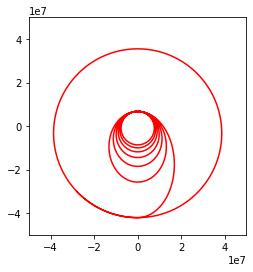

In [ ]:
fig, ax = plt.subplots()
xdata = []
ydata = []
line, = plt.plot([], [], 'r', animated=True)

rx = []
ry = []
for i in range(len(leo2geo[1])):
  if i % 1750 == 0:
    rx.append(leo2geo[1][i])
    ry.append(leo2geo[2][i])

def init():
  ax.set_xlim(-50000000, 50000000)
  ax.set_ylim(-50000000, 50000000)
  ax.set_aspect("equal")
  line.set_data(xdata, ydata)
  return line,

def animate(i):
  xdata.append(rx[i])
  ydata.append(ry[i])
  line.set_data(xdata, ydata)
  return line,

anim = animation.FuncAnimation(fig, animate, init_func=init, 
                               frames=1000, interval=10, blit=True)

rc('animation', html='jshtml')
anim

In [ ]:
# magr vs t
plt.plot(surf2leo[0], surf2leo[3])
plt.ylim(6650000, 6850000)
plt.show()

# magv vs t
plt.plot(surf2leo[0], surf2leo[6])
plt.show()

In [ ]:
# Fuel consumption
def fuel_used(mass_data):
  mi = mass_data[0]
  mf = mass_data[len(mass_data)-1]
  dm = mi - mf
  return dm

def payload(mass_data):
  mf = mass_data[len(mass_data)-1]
  return mf

print(fuel_used(surf2leo[8]), "kg fuel used (compared to 448370 kg predicted)")
print(payload(surf2leo[8]), "kg payload (compared to 22800 kg predicted)")
print(fuel_used(leo2geo[8]), "kg fuel used (compared to 14500 kg predicted)")
print(payload(leo2geo[8]), "kg payload (compared to 8300 kg predicted)")

527766.7999997918 kg fuel used (compared to 448370 kg predicted)
21287.20000020825 kg payload (compared to 22800 kg predicted)
16571.0 kg fuel used (compared to 14500 kg predicted)
6229.0 kg payload (compared to 8300 kg predicted)
